# Summary:
In this preliminary segmentatin analysis, we cluster users by \[most of] the ***qx*** columns. Including :
['qxactivitiesxdrivers' 'qxactivitiesximportance'
 'qxactivitiesxqualityxindicators' 'qxactivitiesxrecency'
 'qxactivitiesxsatisfaction' 'qxadvocacy01' 'qxadvocacy02' 'qxbrandxlove'
 'qxbrandxtrustxdrivers' 'qxdrivers' 'qxenrichment' 'qxexpectations'
 'qxoverallxqualityxindicators' 'qxretention' 'qxtime' 'qxtransition'
 'qxunlocking']
 
We dropped columns pertaining to brand, model, upgrade, etc. 

We've standardized the data and replaced missing values with 0 (i.e. the mean in the unstardadized data). 

Note that there is a surprisingly high number of columns where all data is misisng (749!). These columns have no impact on the analysis (no variation amongst users after replacing missing values with 0 in standarrdized version. 327 columns remain.
 
Optimal number of clusters determined to be 3 using Elbow Method. The there clusters are differentiated by the distribution of  varibles pertaining to importance and quality of various activities. Cluster two, specifically has lower ratings across the board for the importance and quality of various activities. This cluster is also heavily dominated by *iPhone users*.  **test stat sig of these statements**

### Examining feature importance for Cluster 2 membership:
- Via highest coeff: 
    - qxactivitiesxqualityxindicators_2_10	(enjoyable - managing notifications)
    - qxactivitiesxqualityxindicators_1_23 (Reinforces trust - mobile payment)
    - qxactivitiesxdrivers_25_24 (new experiences - asking digital assistant a question)
    - qxactivitiesxsatisfaction_21	(satisfied - tracking your wellbeing)
    
### Examining the statistical significance of differneces in attributes across groups....

- the biggest statistical differences are observed betweem cluster 0 & cluster 2 in particular with respect to

    - ATT01. Technology is important to me
    - RET06. I’m always willing to try or do new things
    - ATT02. I expect companies to make their websites mobile-friendly
    - ATT02. I expect companies to have a mobile app
    - ATT01. I put a lot of time and energy into my career
    - ATT01. I like to impress people with my lifestyle
    - SOC03. How frequently do you use social networks or online social tools to talk/post about products or services?

- then, the biggest statistical differences are next observed betweem cluster 0 & cluster 1 in particular with respect to

    - ATT02. I expect companies to make their websites mobile-friendly
    - RET06. I’m always willing to try or do new things
    - ATT02. I expect companies to have a mobile app
    - ATT01. Technology is important to me

- lastly, the smallest statistical differences are observed betweem cluster 1 & cluster 2 in particular with respect to

    - ATT01. Technology is important to me
    - RET06. I’m always willing to try or do new thing
    - ATT02. I expect companies to make their websites mobile-friendly
 

# Residial Q's / FUP's :
- What are the hidactivitiesqualified_ variables?
- qxactivitiesxqualityxindicators_ got excluded with \_get_numeric_data
- stat sig of eyeballed takeaways
    - can't apply ANOVA or KW if the observations were assigned to groups (clusters) based on the input data set itself.
- large number of missing obs for certain cols (in many cases, all rows!)

In [56]:
import pandas as pd
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf
from matplotlib.backends.backend_pdf import PdfPages

%matplotlib inline 


# Seaborn visualization library
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.datasets.samples_generator import make_blobs
from sklearn.cluster import KMeans


from sklearn.linear_model import LogisticRegression

import scipy

In [21]:
pd.set_option('display.max_columns', 1000)
pd.options.display.max_rows=1000

pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', 1000)

plt.rcParams.update({'figure.max_open_warning': 0})


In [24]:
import random
random.seed( 0 )

# Load in Data

In [25]:
root = r"../data/input/07 Samsung UX Index - Web App Implementation/"

fname_data = root + r"Samsung UX Index Survey_Data.csv"
df_data = pd.read_csv(fname_data)

fname_vaxmap = root + r"Samsung UX Index Survey_Datamap.xlsx"
df_varmap = pd.read_excel(fname_vaxmap, header=1, sheet_name=0)
df_valmap = pd.read_excel(fname_vaxmap, header=1, sheet_name=1)

/usr/local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (1218) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# List Data Columns

In [26]:
print([x for x in df_data.columns])

['respid', 'WEIGHT', 'd2', 'hidagemodels', 'qxcurrentxmodel', 'hbrand', 'hmodelquota', 'qxtime', 'qxoverallxqualityxindicators_1', 'qxoverallxqualityxindicators_2', 'qxoverallxqualityxindicators_3', 'qxoverallxqualityxindicators_4', 'qxactivitiesximportance_1', 'qxactivitiesximportance_2', 'qxactivitiesximportance_3', 'qxactivitiesximportance_4', 'qxactivitiesximportance_5', 'qxactivitiesximportance_6', 'qxactivitiesximportance_7', 'qxactivitiesximportance_8', 'qxactivitiesximportance_9', 'qxactivitiesximportance_10', 'qxactivitiesximportance_11', 'qxactivitiesximportance_12', 'qxactivitiesximportance_13', 'qxactivitiesximportance_14', 'qxactivitiesximportance_15', 'qxactivitiesximportance_16', 'qxactivitiesximportance_17', 'qxactivitiesximportance_18', 'qxactivitiesximportance_19', 'qxactivitiesximportance_20', 'qxactivitiesximportance_21', 'qxactivitiesximportance_22', 'qxactivitiesximportance_23', 'qxactivitiesximportance_24', 'qxactivitiesximportance_25', 'qxactivitiesxrecency_1', 

In [27]:
print( np.unique(np.array(([x.split('_')[0] for x in df_data.columns]))))

['AR' 'Empowered' 'UX' 'UXindex' 'WEIGHT' 'alarm' 'att01' 'att02'
 'calendar' 'charging' 'customizing' 'd1' 'd2' 'd3' 'd4' 'd5x1' 'd5x2'
 'd6' 'd7' 'digital' 'display' 'front' 'hbrand' 'hidactivitiesqualified'
 'hidagemodels' 'hmodelquota' 'location' 'mobile' 'multiple'
 'notifications' 'organizing' 'photo' 'quick' 'qxactivitiesxdrivers'
 'qxactivitiesximportance' 'qxactivitiesxqualityxindicators'
 'qxactivitiesxrecency' 'qxactivitiesxsatisfaction' 'qxadvocacy01'
 'qxadvocacy02' 'qxbrandxlove' 'qxbrandxtrustxdrivers' 'qxcurrentxcarrier'
 'qxcurrentxmodel' 'qxcurrentxos' 'qxcurrentxosx02' 'qxcurrentxstorage'
 'qxdrivers' 'qxdriversxoe' 'qxenrichment' 'qxexpectations'
 'qxotherxdevices' 'qxoverallxqualityxindicators' 'qxpreviousxbrand'
 'qxpreviousxmodel' 'qxretention' 'qxtime' 'qxtransition' 'qxunlocking'
 'qxupgrade01' 'rear' 'respid' 'ret06' 'search' 'sending' 'sharing'
 'soc03' 'soc04' 'speaker' 'tracking' 'transferring' 'unlocking' 'using'
 'video']


In [28]:
df_varmap.head().style.set_properties(subset=['Label'], **{'width': '300px'})

,Variable,Label,Short Label,Type,Minimum,Maximum,Description
0,respid,RESPID,ID,integer,104,7436,"respid = integer (min: 104, max: 7436) - ID"
1,WEIGHT,Weight,weight,float,0.0303218,7.20776,"WEIGHT = float (min: 0.030321847, max: 7.207764977) - weight"
2,d2,D2. What is your age?,age,integer,18,38,"d2 = integer (min: 18, max: 38) - age"
3,hidagemodels,hidagemodels. Age groups by models:,age group,integer,1,3,"hidagemodels = integer (min: 1, max: 3) - age group"
4,qxcurrentxmodel,"Q_Current_Model. Which smartphone model do you currently use as your primary smartphone (i.e., the one that you use most often for your personal needs)?",model,integer,11,53,"qxcurrentxmodel = integer (min: 11, max: 53) - model"


In [29]:

df_varmap[df_varmap.Variable.str.contains("qxactivitiesxrecency_16")].style.set_properties(subset=['Label'], 
                                                                                   **{'width': '300px'})

,Variable,Label,Short Label,Type,Minimum,Maximum,Description
52,qxactivitiesxrecency_16,"Q_Activities_Recency. Taking a picture (selfie) with the front-facing camera - When was the last time you did each of the following on your [MODEL]? Please think of your experience with the preinstalled manufacturer apps only, and don’t consider your exp",front camera,integer,1,9,"qxactivitiesxrecency_16 = integer (min: 1, max: 9) - front camera"


# Segmentation based on  all [qx] columns

In [30]:
# select columns that start with qx
qx_list = [ x for x in df_data.columns if 'qx' in x ]
print(len(qx_list))

# drop qxcurrentxmodel (Which smartphone model do you currently use...)
qx_list = [ x for x in qx_list if 'qxcurrentxmodel' not in x ]
print(len(qx_list))

# drop qxotherxdevices (Q_Other_Devices. XXX - XX - What brands of the following devices do you own?)
qx_list = [ x for x in qx_list if 'qxotherxdevices' not in x ]
print(len(qx_list))

# drop qxcurrentxcarrier (Q_Current_Carrier. Which mobile carrier do you use on your...?)
qx_list = [ x for x in qx_list if 'qxcurrentxcarrier' not in x ]
print(len(qx_list))

# drop qxcurrentxos (Q_Current_OS. Which version of XXX are you currently using on your smartphone?)
qx_list = [ x for x in qx_list if 'qxcurrentxos' not in x ]
print(len(qx_list))

# drop qxcurrentxstorage
qx_list = [ x for x in qx_list if 'qxcurrentxstorage' not in x ]
print(len(qx_list))

# drop qxpreviousxbrand
qx_list = [ x for x in qx_list if 'qxpreviousxbrand' not in x ]
print(len(qx_list))

# drop qxpreviousxmodel
qx_list = [ x for x in qx_list if 'qxpreviousxmodel' not in x ]
print(len(qx_list))

# drop qxupgrade
qx_list = [ x for x in qx_list if 'qxupgrade' not in x ]
print(len(qx_list))

# drop qxdriversxoe (QxDriversxOE. What else, besides those things 
# that you have just rated, is important for you in a smartphone? 
# Please think about it at a higher level, in terms of what a 
# smartphone can do for you, how it may make you feel, and how you 
# would like the proce)
qx_list = [ x for x in qx_list if 'xoe' not in x ]
print(len(qx_list))

df_data_sub = df_data[qx_list]

# list all column categories
print( np.unique(np.array(([x.split('_')[0] for x in df_data_sub.columns]))))


1170
1169
1115
1113
1110
1109
1107
1087
1077
1076
['qxactivitiesxdrivers' 'qxactivitiesximportance'
 'qxactivitiesxqualityxindicators' 'qxactivitiesxrecency'
 'qxactivitiesxsatisfaction' 'qxadvocacy01' 'qxadvocacy02' 'qxbrandxlove'
 'qxbrandxtrustxdrivers' 'qxdrivers' 'qxenrichment' 'qxexpectations'
 'qxoverallxqualityxindicators' 'qxretention' 'qxtime' 'qxtransition'
 'qxunlocking']


In [31]:
# list non  integer columns  to be coerced into ints
coerce_cols = df_data_sub.dtypes[df_data_sub.dtypes!='int64'].index.to_list()
df_data_sub[coerce_cols] = df_data_sub[coerce_cols].apply(pd.to_numeric, errors='coerce')

/usr/local/lib/python3.7/site-packages/pandas/core/frame.py:3489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [32]:
# list all column types
print( np.unique(np.array(([x.split('_')[0] for x in df_data_sub.columns]))))
print()
# confirm all are numeric types
print(np.unique(df_data_sub.dtypes.to_frame()[0].to_list()))
print()
print(df_data_sub.shape)
df_data_sub.describe()

['qxactivitiesxdrivers' 'qxactivitiesximportance'
 'qxactivitiesxqualityxindicators' 'qxactivitiesxrecency'
 'qxactivitiesxsatisfaction' 'qxadvocacy01' 'qxadvocacy02' 'qxbrandxlove'
 'qxbrandxtrustxdrivers' 'qxdrivers' 'qxenrichment' 'qxexpectations'
 'qxoverallxqualityxindicators' 'qxretention' 'qxtime' 'qxtransition'
 'qxunlocking']

[dtype('int64') dtype('float64')]

(3254, 1076)


qxtime  qxoverallxqualityxindicators_1  qxoverallxqualityxindicators_2  qxoverallxqualityxindicators_3  qxoverallxqualityxindicators_4  qxactivitiesximportance_1  qxactivitiesximportance_2  qxactivitiesximportance_3  qxactivitiesximportance_4  qxactivitiesximportance_5  qxactivitiesximportance_6  qxactivitiesximportance_7  qxactivitiesximportance_8  qxactivitiesximportance_9  qxactivitiesximportance_10  qxactivitiesximportance_11  qxactivitiesximportance_12  qxactivitiesximportance_13  qxactivitiesximportance_14  qxactivitiesximportance_15  qxactivitiesximportance_16  qxactivitiesximportance_17  qxactivitiesximportance_18  qxactivitiesximportance_19  qxactivitiesximportance_20  qxactivitiesximportance_21  qxactivitiesximportance_22  qxactivitiesximportance_23  qxactivitiesximportance_24  qxactivitiesximportance_25  qxactivitiesxrecency_1  qxactivitiesxrecency_2  qxactivitiesxrecency_3  qxactivitiesxrecency_4  qxactivitiesxrecency_5  qxactivitiesxrecency_6  \
count  3254.000000                     3254.000000                     3254.000000                     3254.000000                     3254.000000                3254.000000                3254.000000                3254.000000                3254.000000                3254.000000                3254.000000                3254.000000                3254.000000                3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000                 3254.000000             3254.000000             3254.000000             3254.000000             3254.000000             3254.000000             3254.000000   
mean      4.086355                        5.744007                        5.775661                        5.905040                        6.094960                   5.522434                   6.251998                   5.031346                   5.748617                   5.801475                   4.183467                   5.314075                   5.512907                   5.387523                    5.436693                    5.363553                    5.308851                    5.799017                    6.261832                    5.909342                    5.554702                    5.593731                    5.183159                    5.576214                    5.933006                    4.255685                    4.815304                    4.535034                    4.179779                    3.527966                1.668101                1.344499                3.934849                1.660725                1.648740                3.484634   
std       1.428137                        1.269394                        1.220311                        1.207067                        1.095453                   1.471928                   1.106302                   1.674275                   1.442447                   1.330407                   1.909372                   1.447834                   1.381997                   1.435608                    1.417520                    1.508753                    1.591227                    1.383953                    1.114270                    1.337838                    1.541092                    1.412790                    1.571616                    1.407087                    1.303522                    1.874749                    1.711608                    1.952676                    1.975397                    2.000227                1.220728                1.062570                2.099301                1.637014                1.264997                2.462178   
min       1.000000                        1.000000                      

In [33]:
# Count Na values
df_data_sub.isna().sum()[df_data_sub.isna().sum()>0].sort_values(ascending=False)

qxactivitiesxdrivers_23_11              3254
qxactivitiesxdrivers_15_9               3254
qxactivitiesxdrivers_27_9               3254
qxactivitiesxdrivers_26_9               3254
qxactivitiesxdrivers_25_9               3254
qxactivitiesxdrivers_24_9               3254
qxactivitiesxdrivers_22_9               3254
qxactivitiesxdrivers_21_9               3254
qxactivitiesxdrivers_19_9               3254
qxactivitiesxdrivers_18_9               3254
qxactivitiesxdrivers_17_9               3254
qxactivitiesxdrivers_16_9               3254
qxactivitiesxdrivers_14_9               3254
qxactivitiesxdrivers_29_9               3254
qxactivitiesxdrivers_13_9               3254
qxactivitiesxdrivers_12_9               3254
qxactivitiesxdrivers_10_9               3254
qxactivitiesxdrivers_9_9                3254
qxactivitiesxdrivers_8_9                3254
qxactivitiesxdrivers_7_9                3254
qxactivitiesxdrivers_6_9                3254
qxactivitiesxdrivers_5_9                3254
qxactiviti

In [34]:
# cofnirm nan is the only (unique) value in a column that supposedly has 3254 nan values
df_data_sub.qxactivitiesxdrivers_29_9.unique()

array([nan])

In [35]:
# check original values in columns -- also missing
df_data.qxactivitiesxdrivers_29_9.unique()

array([' '], dtype=object)

In [36]:
# drop columns where are values are missing 
# qxactivitiesxdrivers_2_1
cols_allmissing = df_data_sub.isna().sum()[df_data_sub.isna().sum()==3254].index.to_list()
print(len(cols_allmissing))
print(df_data_sub.shape)
df_data_sub = df_data_sub.drop(cols_allmissing, axis = 1) 
print(df_data_sub.shape)

749
(3254, 1076)
(3254, 327)


Combinations of Driver and App that do not match (i feel CREATIVE when changing SETTINGS.

In [83]:
cols_allmissing

['qxactivitiesxdrivers_2_1',
 'qxactivitiesxdrivers_3_1',
 'qxactivitiesxdrivers_4_1',
 'qxactivitiesxdrivers_5_1',
 'qxactivitiesxdrivers_7_1',
 'qxactivitiesxdrivers_8_1',
 'qxactivitiesxdrivers_9_1',
 'qxactivitiesxdrivers_10_1',
 'qxactivitiesxdrivers_11_1',
 'qxactivitiesxdrivers_12_1',
 'qxactivitiesxdrivers_14_1',
 'qxactivitiesxdrivers_15_1',
 'qxactivitiesxdrivers_16_1',
 'qxactivitiesxdrivers_17_1',
 'qxactivitiesxdrivers_18_1',
 'qxactivitiesxdrivers_19_1',
 'qxactivitiesxdrivers_20_1',
 'qxactivitiesxdrivers_21_1',
 'qxactivitiesxdrivers_22_1',
 'qxactivitiesxdrivers_23_1',
 'qxactivitiesxdrivers_24_1',
 'qxactivitiesxdrivers_25_1',
 'qxactivitiesxdrivers_26_1',
 'qxactivitiesxdrivers_27_1',
 'qxactivitiesxdrivers_28_1',
 'qxactivitiesxdrivers_29_1',
 'qxactivitiesxdrivers_30_1',
 'qxactivitiesxdrivers_31_1',
 'qxactivitiesxdrivers_32_1',
 'qxactivitiesxdrivers_33_1',
 'qxactivitiesxdrivers_1_2',
 'qxactivitiesxdrivers_2_2',
 'qxactivitiesxdrivers_3_2',
 'qxactivitiesxdrive

In [37]:
# Standardize the qx_list columns
scaler = StandardScaler().fit(df_data_sub)
df_data_sub_std = df_data_sub.copy()
df_data_sub_std[df_data_sub.columns] = scaler.transform(df_data_sub)
df_data_sub_std.describe()

,qxtime,qxoverallxqualityxindicators_1,qxoverallxqualityxindicators_2,qxoverallxqualityxindicators_3,qxoverallxqualityxindicators_4,qxactivitiesximportance_1,qxactivitiesximportance_2,qxactivitiesximportance_3,qxactivitiesximportance_4,qxactivitiesximportance_5,qxactivitiesximportance_6,qxactivitiesximportance_7,qxactivitiesximportance_8,qxactivitiesximportance_9,qxactivitiesximportance_10,qxactivitiesximportance_11,qxactivitiesximportance_12,qxactivitiesximportance_13,qxactivitiesximportance_14,qxactivitiesximportance_15,qxactivitiesximportance_16,qxactivitiesximportance_17,qxactivitiesximportance_18,qxactivitiesximportance_19,qxactivitiesximportance_20,qxactivitiesximportance_21,qxactivitiesximportance_22,qxactivitiesximportance_23,qxactivitiesximportance_24,qxactivitiesximportance_25,qxactivitiesxrecency_1,qxactivitiesxrecency_2,qxactivitiesxrecency_3,qxactivitiesxrecency_4,qxactivitiesxrecency_5,qxactivitiesxrecency_6,qxactivitiesxrecency_7,qxactivitiesxrecency_8,qxactivitiesxrecency_9,qxactivitiesxrecency_10,qxactivitiesxrecency_11,qxactivitiesxrecency_12,qxactivitiesxrecency_13,qxactivitiesxrecency_14,qxactivitiesxrecency_15,qxactivitiesxrecency_16,qxactivitiesxrecency_17,qxactivitiesxrecency_18,qxactivitiesxrecency_19,qxactivitiesxrecency_20,qxactivitiesxrecency_21,qxactivitiesxrecency_22,qxactivitiesxrecency_23,qxactivitiesxrecency_24,qxactivitiesxrecency_25,qxactivitiesxqualityxindicators_1_1,qxactivitiesxqualityxindicators_2_1,qxactivitiesxqualityxindicators_3_1,qxactivitiesxqualityxindicators_4_1,qxactivitiesxqualityxindicators_1_2,qxactivitiesxqualityxindicators_2_2,qxactivitiesxqualityxindicators_3_2,qxactivitiesxqualityxindicators_4_2,qxactivitiesxqualityxindicators_1_3,qxactivitiesxqualityxindicators_2_3,qxactivitiesxqualityxindicators_3_3,qxactivitiesxqualityxindicators_4_3,qxactivitiesxqualityxindicators_1_4,qxactivitiesxqualityxindicators_2_4,qxactivitiesxqualityxindicators_3_4,qxactivitiesxqualityxindicators_4_4,qxactivitiesxqualityxindicators_1_5,qxactivitiesxqualityxindicators_2_5,qxactivitiesxqualityxindicators_3_5,qxactivitiesxqualityxindicators_4_5,qxactivitiesxqualityxindicators_1_6,qxactivitiesxqualityxindicators_2_6,qxactivitiesxqualityxindicators_3_6,qxactivitiesxqualityxindicators_4_6,qxactivitiesxqualityxindicators_1_7,qxactivitiesxqualityxindicators_2_7,qxactivitiesxqualityxindicators_3_7,qxactivitiesxqualityxindicators_4_7,qxactivitiesxqualityxindicators_1_8,qxactivitiesxqualityxindicators_2_8,qxactivitiesxqualityxindicators_3_8,qxactivitiesxqualityxindicators_4_8,qxactivitiesxqualityxindicators_1_9,qxactivitiesxqualityxindicators_2_9,qxactivitiesxqualityxindicators_3_9,qxactivitiesxqualityxindicators_4_9,qxactivitiesxqualityxindicators_1_10,qxactivitiesxqualityxindicators_2_10,qxactivitiesxqualityxindicators_3_10,qxactivitiesxqualityxindicators_4_10,qxactivitiesxqualityxindicators_1_11,qxactivitiesxqualityxindicators_2_11,qxactivitiesxqualityxindicators_3_11,qxactivitiesxqualityxindicators_4_11,qxactivitiesxqualityxindicators_1_12,qxactivitiesxqualityxindicators_2_12,qxactivitiesxqualityxindicators_3_12,qxactivitiesxqualityxindicators_4_12,qxactivitiesxqualityxindicators_1_13,qxactivitiesxqualityxindicators_2_13,qxactivitiesxqualityxindicators_3_13,qxactivitiesxqualityxindicators_4_13,qxactivitiesxqualityxindicators_1_14,qxactivitiesxqualityxindicators_2_14,qxactivitiesxqualityxindicators_3_14,qxactivitiesxqualityxindicators_4_14,qxactivitiesxqualityxindicators_1_15,qxactivitiesxqualityxindicators_2_15,qxactivitiesxqualityxindicators_3_15,qxactivitiesxqualityxindicators_4_15,qxactivitiesxqualityxindicators_1_16,qxactivitiesxqualityxindicators_2_16,qxactivitiesxqualityxindicators_3_16,qxactivitiesxqualityxindicators_4_16,qxactivitiesxqualityxindicators_1_17,qxactivitiesxqualityxindicators_2_17,qxactivitiesxqualityxindicators_3_17,qxactivitiesxqualityxindicators_4_17,qxactivitiesxqualityxindicators_1_18,qxactivitiesxqualityxindicators_2_18,qxactivitiesxqualityxindicators_3_18,qxactivitiesxquality

In [38]:
# Count all Na values, now that they're scaled... 
# did scaling generate nans for columns with *some* missing values? NO
df_data_sub_std.isna().sum()[df_data_sub_std.isna().sum()>0].sort_values(ascending=False)

qxactivitiesxsatisfaction_25            2139
qxactivitiesxqualityxindicators_3_25    2139
qxactivitiesxdrivers_19_25              2139
qxactivitiesxdrivers_18_25              2139
qxactivitiesxdrivers_15_25              2139
qxactivitiesxdrivers_20_25              2139
qxactivitiesxqualityxindicators_1_25    2139
qxactivitiesxqualityxindicators_2_25    2139
qxactivitiesxqualityxindicators_4_25    2139
qxactivitiesxqualityxindicators_4_6     1609
qxactivitiesxdrivers_21_6               1609
qxactivitiesxqualityxindicators_3_6     1609
qxactivitiesxqualityxindicators_1_6     1609
qxactivitiesxqualityxindicators_2_6     1609
qxactivitiesxsatisfaction_6             1609
qxactivitiesxqualityxindicators_3_23    1595
qxactivitiesxqualityxindicators_1_23    1595
qxactivitiesxqualityxindicators_2_23    1595
qxactivitiesxdrivers_19_23              1595
qxactivitiesxqualityxindicators_4_23    1595
qxactivitiesxdrivers_1_23               1595
qxactivitiesxdrivers_26_23              1595
qxactiviti

In [39]:
# fill NA's with 0
df_data_sub_std.fillna(0, inplace=True)

In [40]:
# Count Na values... should totall to 0 across the board
sum(df_data_sub_std.isna().sum()[df_data_sub.isna().sum()>0])

0

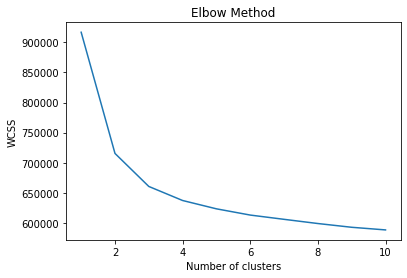

In [41]:
# Using WCSS-based (sum of dists b/w centroids & points for all clusters)...
# ... Elbow Method to find optimal number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_data_sub_std)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [42]:
# Fitting KMeans w/ Optimal number of Clusters
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(df_data_sub_std)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


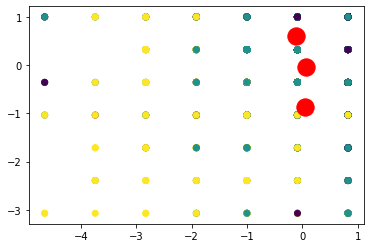

In [43]:
plt.scatter(df_data_sub_std.ix[:,4], df_data_sub_std.ix[:,5], c=pred_y)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

In [44]:
df_data_sub_std['pred'] = pred_y
df_data_sub_std.groupby('pred').describe()

qxtime                                                                       qxoverallxqualityxindicators_1                                                                       qxoverallxqualityxindicators_2                                                                       qxoverallxqualityxindicators_3                                                                       qxoverallxqualityxindicators_4                                                                       qxactivitiesximportance_1                                                                       qxactivitiesximportance_2                                                                       qxactivitiesximportance_3                                                                       qxactivitiesximportance_4                                                                       qxactivitiesximportance_5                                                                       qxactivitiesximportance_6  \
       count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count   
pred                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               
0     1084.0 -0.119913  1.000908 -2.161439 -0.760797 -0.060476  0.639844  2.040486                         1084.0  0.598553  0.671644 -3.737796  0.201696  0.989595  0.989595  0.989595                         1084.0  0.629196  0.678837 -3.914081  0.183866  1.003455  1.003455  1.003455                         1084.0  0.565589  0.651071 -4.064226  0.078682  0.907264  0.907264  0.907264                         1084.0  0.512144  0.659249 -4.651722 -0.086699  0.826306  0.826306  0.826306                    1084.0  0.382794  0.852571 -3.072927 -0.354986  1.003984  1.003984  1.003984                    1084.0  0.317614  0.752045 -4.748074 -0.227819  0.676232  0.676232  0.676232                    1084.0  0.318533  0.986991 -2.408186 -0.018725  0.578640  1.176005  1.176005                    1084.0  0.294555  0.895734 -3.292562  0.174302  0.867675  0.867675  0.867675                    1084.0  0.421100  0.789432 -3.609582  0.149244  0.901009  0.901009  0.901009                    1084.0   
1     1501.0  0.066431

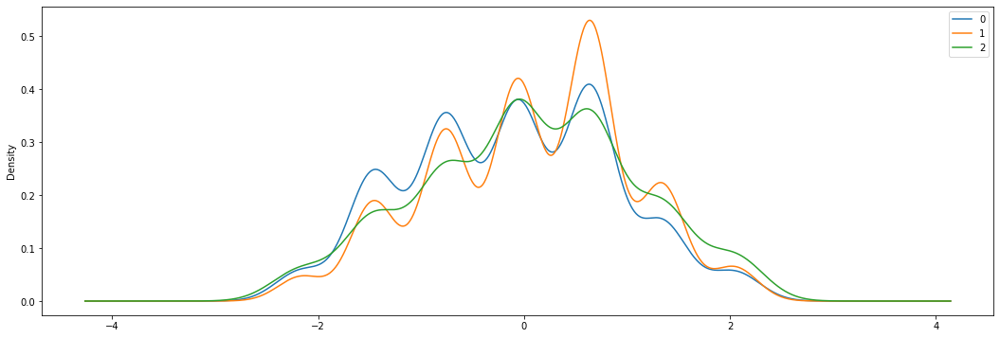

In [45]:
fig, ax = plt.subplots(figsize=(18,6))

for name, group in df_data_sub_std.groupby('pred'):
    group['qxtime'].plot( kind='kde', ax=ax, label=name, legend=True)

plt.show()

pred
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: qxtime, dtype: object

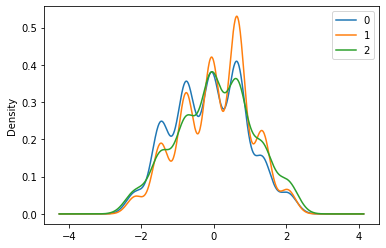

In [46]:
df_data_sub_std.groupby('pred')['qxtime'].plot(kind='kde', ax=plt.gca(), legend=True)


In [47]:
df_data_sub_std.shape

(3254, 328)

In [48]:
# fig, axes = plt.subplots(22,5, figsize=(150,50))
# for col, ax in zip(df_data_sub_std.columns, axes.flatten()):
# #     group.plot(x='brent', y='sp500', kind='scatter', ax=ax, title=year)
#     try:
#         df_data_sub_std.groupby('pred')[col].plot(kind='kde', ax=ax, title=col)
#     except:
#         print('error: '+col)

# Save Each Plot to PDF 

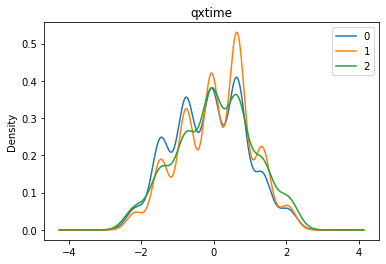

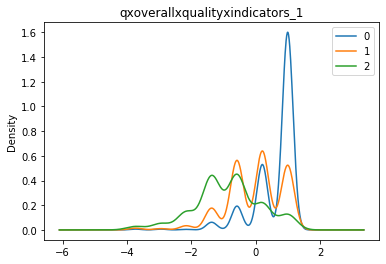

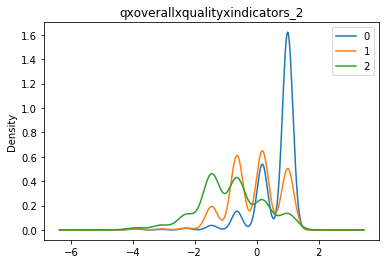

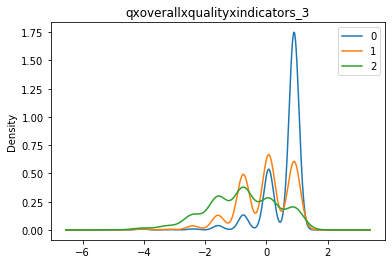

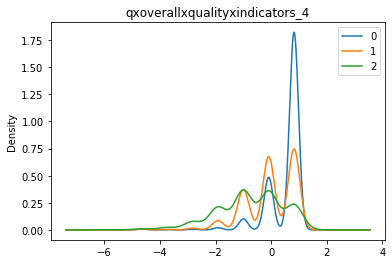

...

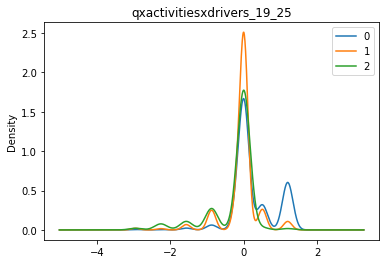

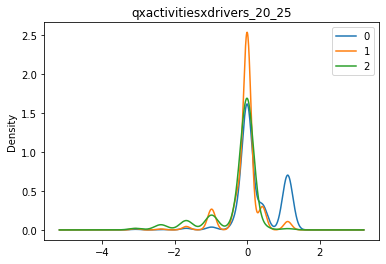

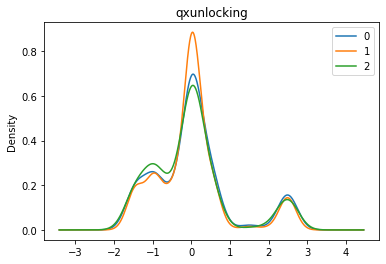

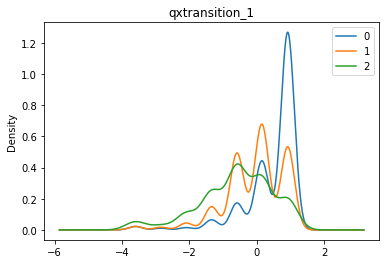

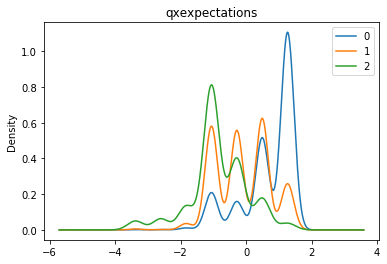

In [49]:
with PdfPages('../data/output/Seg0_KNN3_clusterbyqx.pdf') as pdf:
    plt.ioff()
    for col in df_data_sub_std.columns.drop(['pred']):
        plt.figure()
        fig=df_data_sub_std.groupby('pred')[col].plot(kind='kde', title=col, legend=True)[0].get_figure()
        pdf.savefig(fig)


# Observations - qx variables
### note it's not vaid to run statistical tests on variables determining cluster memebrship

# overall.pdf -- lacks variables that gor coerced to numeric
Cluster 1 has much higher values; cluster 2 much lower values 
for all qxoverallxqualityxindicators (overall trust, overall feeling, overall function, overall simplicity)
 Cluster 1 has much higher values; cluster 2 much lower values 
qxactivitiesximportance_1 
( How important is it for you that a smartphone performs well [Using speaker phone (including all aspects of it, such as dialing, quality of sound, etc.)])
qxactivitiesximportance_3, 4, 5, 6, 7, 8, 9
 Cluster 2 has comparable values for 
qxactivitiesximportance_2
(How important is it for you that a smartphone performs well  [Charging battery (including wired charge, wireless charge, different charge options, the accuracy of the battery indicator, etc.)])

 Cluster 1 tends to rate all activities as important, Cluster 2 as not important and Cluster 0 as somewhere in between, similarly for overall quality indicators. Except for qxactivitiesximportance_2 (How important is it for you that a smartphone performs well  [Charging battery (including wired charge, wireless charge, different charge options, the accuracy of the battery indicator, etc.)]) where cluster 2 has comprable values to cluster 1.

 Recency is simolarly distributed across all clusters but with higher (less recent values) for Cluster 2. Except for \_25 (Using an AR)
first 5 recencies similarly distributed -- the basics



 qxadvocacy01_, qxretention, qxenrichment_, qxbrandxlove_, qxbrandxtrustxdrivers, qxdrivers  much higher for C1 than C2 (C0 somewhere in between)

 qxunlocking similarly distributed across all clusters

 So C1 very engaged 



# overall2.pdf 
qxoverallxqualityxindicators_N:
C0 higher; C2 lower 
(for all N)

qxactivitiesximportance_N:
C0 higher , C2 lower
(for all N except 2)
see 21, 24, 25 for most striking difference

qxactivitiesxrecency_N 
same for all groups
for all N 

qxactivitiesxqualityxindicators
C0 higher; C2 lower 
(for all N)

qxactivitiesxsatisfaction
C0 higher; C2 lower 
(for all N)

qxbrandxtrustxdrivers
C0 higher; C2 lower 
(for all N)

qxdrivers_
C0 higher; C2 lower 
(for all N)

qxactivitiesxdrivers_
C0 higher; C2 lower 
(for all N)

# Seg0_KNN3_clusterbyqx.pdf
### C0 higher; C2 lower; C0 peaked at high values, C2 smoother distribution
- qxoverallxqualityxindicators_  (for all N)
- qxactivitiesximportance_N (for all N, less striking for N=\[6,21,25\])
- qxactivitiesxqualityxindicators_N_N (for all N, less striking for N=\[N_3, N_6, N_11, N_21, N_22, N_23, N_24, N_25\])
- qxactivitiesxsatisfaction_N (for all N, less striking for N=\[3,6, 21, 22,23,24,25\])
- qxactivitiesxdrivers_N_N (for all N, less striking for N=\[1_3, 29_3, 34_11, 10_18, 16_18, 18_18, 19_18, 20_18, 24_18, 7_21, 12_21, 26_21, 37_21, 31_21, 31_22, 1_23, 19_23, 26_23, N_24, N_25 \])
- qxtransition_1
- qxexpectations (but C2 not smooth, heavily low values)
### C0, C1, C2 similarly distributed 
- qxactivitiesxrecency_N (for all N)
- qxunlocking

# Observations - non-qx, "attribute" variables
### we can run stats test on these

In [50]:
df_data['pred'] = pred_y

In [51]:
# get columns not in df_data_sub_std
att_cols = [item for item in df_data.columns if item not in df_data_sub_std.columns]
att_cols =[item for item in att_cols if item not in  cols_allmissing] 
att_cols

['respid',
 'WEIGHT',
 'd2',
 'hidagemodels',
 'qxcurrentxmodel',
 'hbrand',
 'hmodelquota',
 'hidactivitiesqualified_1',
 'hidactivitiesqualified_2',
 'hidactivitiesqualified_3',
 'hidactivitiesqualified_4',
 'hidactivitiesqualified_5',
 'hidactivitiesqualified_6',
 'hidactivitiesqualified_7',
 'hidactivitiesqualified_8',
 'hidactivitiesqualified_9',
 'hidactivitiesqualified_10',
 'hidactivitiesqualified_11',
 'hidactivitiesqualified_12',
 'hidactivitiesqualified_13',
 'hidactivitiesqualified_14',
 'hidactivitiesqualified_15',
 'hidactivitiesqualified_16',
 'hidactivitiesqualified_17',
 'hidactivitiesqualified_18',
 'hidactivitiesqualified_19',
 'hidactivitiesqualified_20',
 'hidactivitiesqualified_21',
 'hidactivitiesqualified_22',
 'hidactivitiesqualified_23',
 'hidactivitiesqualified_24',
 'hidactivitiesqualified_25',
 'qxdriversxoe',
 'qxcurrentxos',
 'qxcurrentxos_9_other',
 'qxcurrentxosx02',
 'qxcurrentxstorage',
 'qxcurrentxcarrier',
 'qxcurrentxcarrier_5_other',
 'qxotherxdev

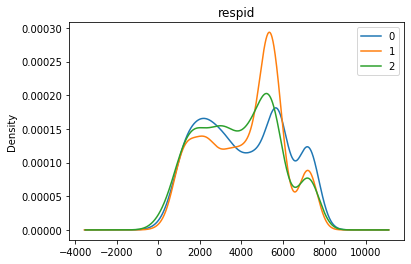

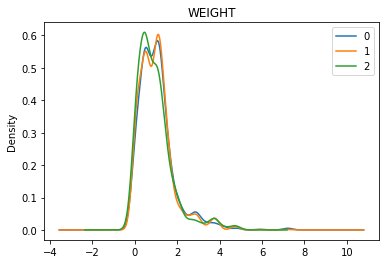

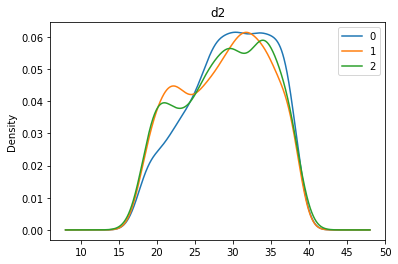

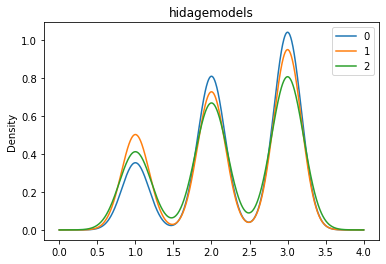

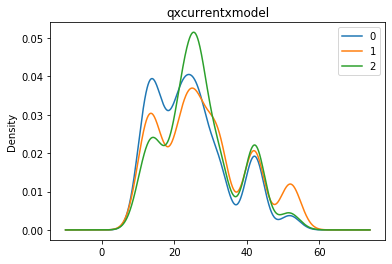

...

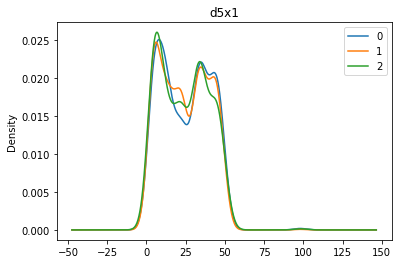

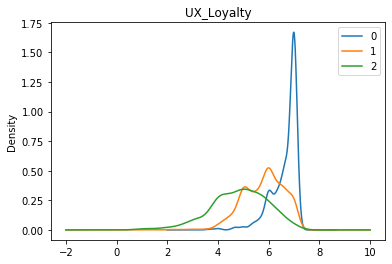

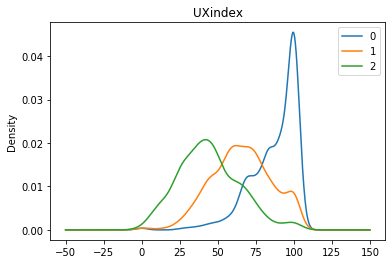

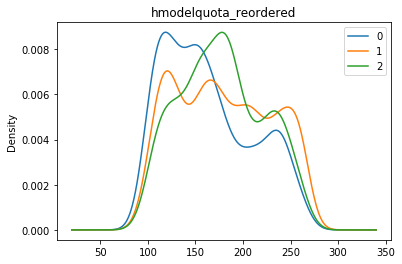

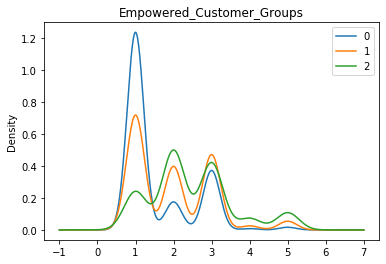

In [52]:
with PdfPages('../data/output/Seg0_KNN3_clusterbyatt.pdf') as pdf:
    plt.ioff()
    for col in att_cols:
        if pd.api.types.is_numeric_dtype(df_data[col]):
            plt.figure()
            fig=df_data.groupby('pred')[col].plot(kind='kde', title=col, legend=True)[0].get_figure()
            pdf.savefig(fig)


In [58]:
# Testing whether the populations have statistically sig diff in means (assuming N distr)
# For two independent samples w/ potentially !=  variance, use Welch's t-test

# scipy.stats.ttest_ind(cat1['values'], cat2['values'], equal_var=False)

t_test_results = {}
for col in att_cols:
    if pd.api.types.is_numeric_dtype(df_data[col]):
        g0 = df_data.where(df_data.pred==0).dropna()[col]
        g1 = df_data.where(df_data.pred==1).dropna()[col]
        g2 = df_data.where(df_data.pred==2).dropna()[col]
        
        t_test_results[col+"_01"] = scipy.stats.ttest_ind(g0,g1, equal_var=False)
        t_test_results[col+"_02"] = scipy.stats.ttest_ind(g0,g2, equal_var=False)
        t_test_results[col+"_12"] = scipy.stats.ttest_ind(g1,g2, equal_var=False)

In [59]:
t_test_results

{'respid_01': Ttest_indResult(statistic=-0.27993658060810445, pvalue=0.7795528325236006),
 'respid_02': Ttest_indResult(statistic=2.3750311005102667, pvalue=0.017674988980007245),
 'respid_12': Ttest_indResult(statistic=2.859763720253777, pvalue=0.0043110658050038945),
 'WEIGHT_01': Ttest_indResult(statistic=0.9522471034630704, pvalue=0.3410741913309303),
 'WEIGHT_02': Ttest_indResult(statistic=2.160196632619008, pvalue=0.03092542029701609),
 'WEIGHT_12': Ttest_indResult(statistic=1.4998217661776583, pvalue=0.1339183080323262),
 'd2_01': Ttest_indResult(statistic=3.9596700402867313, pvalue=7.725894169869596e-05),
 'd2_02': Ttest_indResult(statistic=2.5587407777477567, pvalue=0.010616055920543948),
 'd2_12': Ttest_indResult(statistic=-0.6050721621137769, pvalue=0.5452419434670781),
 'hidagemodels_01': Ttest_indResult(statistic=3.7280424981610802, pvalue=0.00019741155829904663),
 'hidagemodels_02': Ttest_indResult(statistic=2.931710394958856, pvalue=0.0034292968151886753),
 'hidagemodels

In [60]:
results_df = pd.DataFrame.from_dict(t_test_results,orient='Index')
results_df.columns = ['statistic','pvalue']
results_df = results_df.sort_values('pvalue', ascending=True)

In [61]:
results_df.head(10)

,statistic,pvalue
UXindex_02,46.712836,2.866282e-265
UX_Loyalty_01,32.282080,1.127588e-191
UX_Loyalty_02,38.919605,3.043731e-189
UXindex_01,30.907164,2.383442e-178
UXindex_12,22.889183,9.099560e-97
att01_2_02,20.442584,3.742008e-80
ret06_1_02,20.187680,8.664651e-79
UX_Loyalty_12,19.674619,7.772545e-73
att02_2_02,18.913198,3.317266e-68
Empowered_Customer_Groups_02,-18.214228,1.835142e-65


## Conslusion:
Assuming that the the two clusters have equal means, you’d obtain >= observed difference in <=1% of studies due to random sampling error for the following attributes & groups:

In [62]:
results_df['Variable_Grp'] = results_df.index
results_df['Variable'] = results_df.Variable_Grp.replace("_01|_02|_12","", regex=True)
# results_df['Variable'] = results_df.Variable_Grp.replace("_01|_02|_12","", regex=True)
results_df_p01 = results_df[results_df.pvalue<=.01].merge(df_varmap[['Variable', 'Label']], 
                                         on='Variable', how='left')
results_df_p01

,statistic,pvalue,Variable_Grp,Variable,Label
0,46.712836,2.866282e-265,UXindex_02,UXindex,UX_Index
1,32.282080,1.127588e-191,UX_Loyalty_01,UX_Loyalty,UX_loyalty
2,38.919605,3.043731e-189,UX_Loyalty_02,UX_Loyalty,UX_loyalty
3,30.907164,2.383442e-178,UXindex_01,UXindex,UX_Index
4,22.889183,9.099560e-97,UXindex_12,UXindex,UX_Index
5,20.442584,3.742008e-80,att01_2_02,att01_2,ATT01. Technology is important to me - Please indicate how much each statement describes your attitude towards technology and your lifestyle.
6,20.187680,8.664651e-79,ret06_1_02,ret06_1,RET06. I’m always willing to try or do new things - Please indicate how strongly you agree or disagree with the following statement.
7,19.674619,7.772545e-73,UX_Loyalty_12,UX_Loyalty,UX_loyalty
8,18.913198,3.317266e-68,att02_2_02,att02_2,"ATT02. I expect companies to make their websites mobile-friendly - Please indicate how strongly you agree or disagree with the following statements about interacting with companies on mobile devices (i.e., mobile phones and tablets)."
9,-18.214228,1.835142e-65,Empowered_Customer_Groups_02,Empowered_Customer_Groups,Empowered customer segmentation


In [63]:
# for our null Hypothesis: P1>=P2 (one tailed test) , use pvalue/2
results_df_p01['pvalue_1t'] = results_df_p01['pvalue']/2
results_df_p01
# reject if p/2 < alpha (.01)

,statistic,pvalue,Variable_Grp,Variable,Label,pvalue_1t
0,46.712836,2.866282e-265,UXindex_02,UXindex,UX_Index,1.433141e-265
1,32.282080,1.127588e-191,UX_Loyalty_01,UX_Loyalty,UX_loyalty,5.637940e-192
2,38.919605,3.043731e-189,UX_Loyalty_02,UX_Loyalty,UX_loyalty,1.521865e-189
3,30.907164,2.383442e-178,UXindex_01,UXindex,UX_Index,1.191721e-178
4,22.889183,9.099560e-97,UXindex_12,UXindex,UX_Index,4.549780e-97
5,20.442584,3.742008e-80,att01_2_02,att01_2,ATT01. Technology is important to me - Please indicate how much each statement describes your attitude towards technology and your lifestyle.,1.871004e-80
6,20.187680,8.664651e-79,ret06_1_02,ret06_1,RET06. I’m always willing to try or do new things - Please indicate how strongly you agree or disagree with the following statement.,4.332325e-79
7,19.674619,7.772545e-73,UX_Loyalty_12,UX_Loyalty,UX_loyalty,3.886273e-73
8,18.913198,3.317266e-68,att02_2_02,att02_2,"ATT02. I expect companies to make their websites mobile-friendly - Please indicate how strongly you agree or disagree with the following statements about interacting with companies on mobile devices (i.e., mobile phones and tablets).",1.658633e-68
9,-18.214228,1.835142e-65,Empowered_Customer_Groups_02,Empowered_Customer_Groups,Empowered customer segmentation,9.175710e-66


In [64]:
results_df_p01.to_csv('../data/output/knn_attbyclust_statsig.csv', index=False)

### In summary,

In [93]:
# results_df_p01_02=
results_df_p01_02 = results_df_p01[[y=='02' for y in [ x[-2:] for x in results_df_p01["Variable_Grp"]]]]
results_df_p01_02[['Variable','Label','pvalue_1t']]


,Variable,Label,pvalue_1t
0,UXindex,UX_Index,1.433141e-265
2,UX_Loyalty,UX_loyalty,1.521865e-189
5,att01_2,ATT01. Technology is important to me - Please indicate how much each statement describes your attitude towards technology and your lifestyle.,1.871004e-80
6,ret06_1,RET06. I’m always willing to try or do new things - Please indicate how strongly you agree or disagree with the following statement.,4.332325e-79
8,att02_2,"ATT02. I expect companies to make their websites mobile-friendly - Please indicate how strongly you agree or disagree with the following statements about interacting with companies on mobile devices (i.e., mobile phones and tablets).",1.658633e-68
9,Empowered_Customer_Groups,Empowered customer segmentation,9.175710e-66
10,att02_1,"ATT02. I expect companies to have a mobile app - Please indicate how strongly you agree or disagree with the following statements about interacting with companies on mobile devices (i.e., mobile phones and tablets).",6.656668e-63
12,att01_3,ATT01. I put a lot of time and energy into my career - Please indicate how much each statement describes your attitude towards technology and your lifestyle.,1.910511e-39
17,att01_1,ATT01. I like to impress people with my lifestyle - Please indicate how much each statement describes your attitude towards technology and your lifestyle.,9.437496e-27
20,soc03,SOC03. How frequently do you use social networks or online social tools to talk/post about products or services?,2.250189e-23


the biggest statistical differences are observed betweem **cluster 0 & cluster 2** in particular with respect to. Cluster2>Cluster0
- ATT01_2. Technology is important to me 
- RET06_1. I’m always willing to try or do new things
- ATT02_2. I expect companies to make their websites mobile-friendly
- ATT02_1. I expect companies to have a mobile app 

- ATT01_3. I put a lot of time and energy into my career 
- SOC03. How frequently do you use social networks or online social tools to talk/post about products or services?

In [94]:
results_df_p01_02.sort_values('statistic')[['Variable','Label','pvalue_1t']]

,Variable,Label,pvalue_1t
9,Empowered_Customer_Groups,Empowered customer segmentation,9.175710e-66
20,soc03,SOC03. How frequently do you use social networks or online social tools to talk/post about products or services?,2.250189e-23
25,soc04_1,"SOC04. Read detailed reviews other people posted online about the product or service (e.g., on rating and review sites, on blogs, on online message boards or forums) - Please think about the ways that you research products and services online. How freque",7.465462e-17
34,soc04_2,SOC04. Read a blog post by the company that offers the product or service - Please think about the ways that you research products and services online. How frequently do you…,4.300233e-11
35,hmodelquota_reordered,hmodelquota_reordered,1.173506e-10
42,soc04_3,SOC04. Read a message board or forum hosted by the company that offers the product or service - Please think about the ways that you research products and services online. How frequently do you…,4.748334e-09
51,qxcurrentxmodel,"Q_Current_Model. Which smartphone model do you currently use as your primary smartphone (i.e., the one that you use most often for your personal needs)?",1.565188e-06
52,qxcurrentxos,"Q_Current_OS. Which version of [SHOW IF BRAND=APPLE: iOS; SHOW IF BRAND = SAMSUNG, LG, MOTOROLA, GOOGLE: Android] are you currently using on your smartphone? If you are not sure, you can check this in your settings.",3.693216e-06
58,hbrand,hBrand. Hidden Question - Brand,6.613760e-06
76,qxupgrade01_9,Q_Upgrade.01. Other (specify) - What are the main reasons why you upgraded/purchased a new smartphone?,5.911558e-05


On the flipside, between **cluster 0 & cluster 2** Cluster0>Cluster2 when it comes to 
- Empowered_Customer_Groups. Empowered customer segmentation (likely Progressive Pioneers > Savvy Seekers > Convenience Conformers > Settled Survivors >Reserved Resisters)
- SOC03. How frequently do you use social networks or online social tools to talk/post about products or services? (less freq)
- SOC04_1. Read detailed reviews other people posted online about the product or service (ess likely)
- SOC04_2. Read a blog post by the company that offers the product or service - Please think about the ways that you research products and services online. How frequently do you (less freq)
- SOC04_3. Read a message board or forum hosted by the company that offers the product or service - Please think about the ways that you research products and services online. How frequently do you… (less freq)
- qxcurrentxmodel
- qxcurrentxos
- hbrand
- hbrand STUDENT more likely
- d4 (higher likely, confounded with 7.Prefer not to answer)

then, the biggest statistical differences are next observed between **cluster 0 & cluster 1** in particular with respect to. Cluster0>Cluster1
- ATT02_2. I expect companies to make their websites mobile-friendly
- RET06_1. I’m always willing to try or do new things
- ATT02_1. I expect companies to have a mobile app
- ATT01_2. Technology is important to me

lastly, the smallest statistical differences are observed betweem **cluster 1 & cluster 2** in particular with respect to. Cluster1>Cluster2
- ATT01_2. Technology is important to me 
- RET06-1. I’m always willing to try or do new thing
- ATT02_2. I expect companies to make their websites mobile-friendly

In [98]:
# df_data.groupby('pred')[cols].describe()

# Assign profiles to the clusters

# VIZ ARCHIVE

# hbrand count by cluster

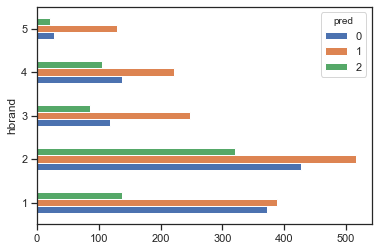

In [310]:
df_data.groupby('pred').hbrand.value_counts().unstack(0).plot.barh()

               hbrand
pred hbrand          
0    2       0.394834
     1       0.343173
     4       0.127306
     3       0.109779
     5       0.024908
1    2       0.343771
     1       0.258494
     3       0.164557
     4       0.147235
     5       0.085943
2    2       0.478326
     1       0.204783
     4       0.156951
     3       0.128550
     5       0.031390


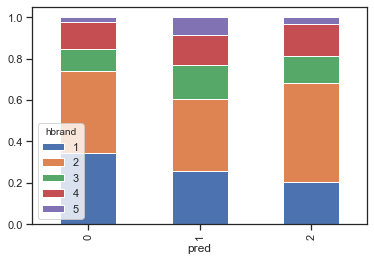

In [311]:
brand_byclust = df_data.groupby('pred').hbrand.value_counts(normalize=True)
print (brand_byclust.to_frame())
brand_byclust.unstack().plot(kind='bar', stacked=True)

# C2 is heavily APPLE

# what does the dist of Empowered_Customer_Groups look like for the clusters?

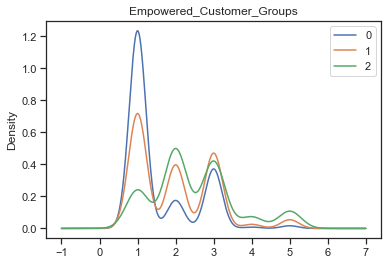

In [312]:
col = 'Empowered_Customer_Groups'
df_data.groupby('pred')[col].plot(kind='kde', title=col, legend=True)[0]

# what does the dist of Empowered_Customer_Groups look like for the brands?

hbrand
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
5    AxesSubplot(0.125,0.125;0.775x0.755)
Name: Empowered_Customer_Groups, dtype: object

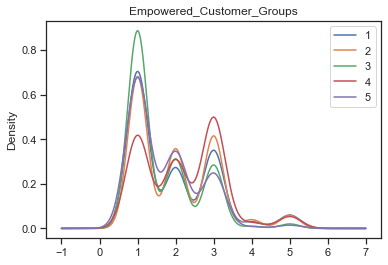

In [313]:
col = 'Empowered_Customer_Groups'
df_data.groupby('hbrand')[col].plot(kind='kde', title=col, legend=True)

                                    hbrand
Empowered_Customer_Groups hbrand          
1                         2       0.368037
                          1       0.295756
                          3       0.175729
                          4       0.098806
                          5       0.061671
2                         2       0.408708
                          1       0.241573
                          4       0.153090
                          3       0.130618
                          5       0.066011
3                         2       0.394399
                          1       0.259043
                          4       0.207701
                          3       0.099183
                          5       0.039673
4                         2       0.500000
                          1       0.296875
                          4       0.140625
                          3       0.046875
                          5       0.015625
5                         2       0.424779
           

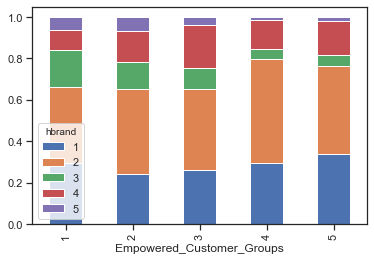

In [314]:
brand_byecg = df_data.groupby(col).hbrand.value_counts(normalize=True)
print (brand_byecg.to_frame())
brand_byecg.unstack().plot(kind='bar', stacked=True)

# How do UX_loyalty and UXIndex vary by cluster?

       count      mean       std       min       25%  50%       75%  max
pred                                                                    
0     1084.0  6.639145  0.518001  3.666667  6.333333  7.0  7.000000  7.0
1     1501.0  5.794581  0.811969  1.000000  5.166667  6.0  6.333333  7.0
2      669.0  4.840309  1.112681  1.000000  4.000000  5.0  5.666667  7.0


pred
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: UX_Loyalty, dtype: object

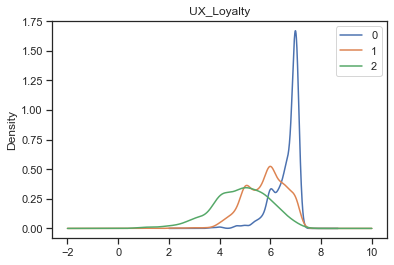

In [317]:
col = 'UX_Loyalty'
print(df_data.groupby('pred')[col].describe())
df_data.groupby('pred')[col].plot(kind='kde', title=col, legend=True)

       count       mean        std       min        25%        50%        75%    max
pred                                                                                
0     1084.0  87.124506  15.560443  0.000000  77.740700  91.754658  100.00000  100.0
1     1501.0  65.763586  19.605409  0.000000  53.421500  66.761406   77.74070  100.0
2      669.0  44.336672  20.076823  0.103148  29.388703  43.613690   57.32817  100.0


pred
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: UXindex, dtype: object

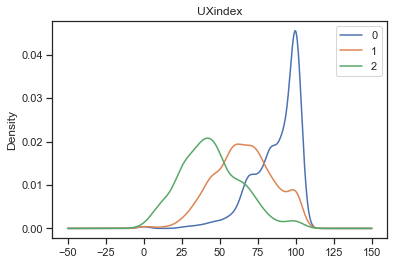

In [318]:
col = 'UXindex'
print(df_data.groupby('pred')[col].describe())
df_data.groupby('pred')[col].plot(kind='kde', title=col, legend=True)

# Determined Variable importance in Cluster 2
https://www.researchgate.net/post/How_can_I_identify_the_variables_that_contribute_most_to_creating_the_partition_between_two_clusters_with_a_logistical_model

In [324]:
df_data_sub_std['pred'].describe()

count    3254.000000
mean        0.872465
std         0.722922
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         2.000000
Name: pred, dtype: float64

In [325]:
df_data_sub_std['pred_2'] = np.where(df_data_sub_std['pred']==2, 1, 0)

In [323]:
df_data_sub_std['pred']

0       1
1       1
2       1
3       1
4       0
       ..
3249    1
3250    1
3251    0
3252    1
3253    1
Name: pred, Length: 3254, dtype: int32

In [347]:
df_data_sub_std_vars=df_data_sub_std.columns.values.tolist()
y = df_data_sub_std['pred_2']
X = df_data_sub_std
X = X.drop(columns=['pred','pred_2'])
X.columns

Index(['qxtime', 'qxoverallxqualityxindicators_1', 'qxoverallxqualityxindicators_2', 'qxoverallxqualityxindicators_3', 'qxoverallxqualityxindicators_4', 'qxactivitiesximportance_1', 'qxactivitiesximportance_2', 'qxactivitiesximportance_3', 'qxactivitiesximportance_4', 'qxactivitiesximportance_5',
       ...
       'qxactivitiesxdrivers_28_25', 'qxactivitiesxdrivers_29_25', 'qxactivitiesxdrivers_30_25', 'qxactivitiesxdrivers_31_25', 'qxactivitiesxdrivers_32_25', 'qxactivitiesxdrivers_33_25', 'qxactivitiesxdrivers_34_25', 'qxunlocking', 'qxtransition_1', 'qxexpectations'], dtype='object', length=1076)

In [348]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [349]:
m = LogisticRegression()
m.fit(X, y)

/usr/local/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

array([-0.11702296,  0.02195603, -0.18512348, ...,  0.03746361,
        0.02151166, -0.05536605])

In [394]:
# The estimated coefficients will all be around 1:
coefs = pd.DataFrame(list(zip(X.columns, m.coef_[0])))
coefs.columns = ['Variable', 'coefficient']
coefs = coefs.sort_values(['coefficient'], ascending=False)
coefs = coefs.merge(df_varmap[['Variable', 'Label']], on='Variable', how='left')
coefs.head(20)

,Variable,coefficient,Label
0,qxactivitiesxqualityxindicators_2_10,0.466901,"Q_Activities_Quality_Indicators. Is enjoyable - Setting up and managing notifications - How much do you agree or disagree with the following about different activities you do with [MODEL]? Again, please think of your experience with the preinstalled manufa"
1,qxactivitiesxqualityxindicators_1_23,0.386157,"Q_Activities_Quality_Indicators. Reinforces my trust in [BRAND] - Making a mobile payment with your smartphone at a store terminal - How much do you agree or disagree with the following about different activities you do with [MODEL]? Again, please think of"
2,qxactivitiesxdrivers_25_24,0.336681,"Q_Activities_Drivers. Asking digital assistant a question - My [MODEL] introduces me to new experiences and adventures - How much do you agree or disagree with the following statements for the activities below? For each of these activities, please think of"
3,qxactivitiesxsatisfaction_21,0.334280,"Q_Activities_Satisfaction. Tracking your wellbeing (steps, exercise, sleep, etc.) - How satisfied are you with your [MODEL]’s performance on each of the activities below?"
4,qxactivitiesxdrivers_19_17,0.289788,"Q_Activities_Drivers. Recording a video - My [MODEL] has innovative capabilities and design that allow me to stand out from the crowd - How much do you agree or disagree with the following statements for the activities below? For each of these activities,"
5,qxactivitiesxsatisfaction_17,0.281992,Q_Activities_Satisfaction. Recording a video - How satisfied are you with your [MODEL]’s performance on each of the activities below?
6,qxactivitiesxqualityxindicators_1_14,0.280316,"Q_Activities_Quality_Indicators. Reinforces my trust in [BRAND] - Sending and receiving a text message - How much do you agree or disagree with the following about different activities you do with [MODEL]? Again, please think of your experience with the pr"
7,qxdrivers_11,0.270242,Q_Drivers. Design and capabilities of my [MODEL] make me feel like my unique identity is respected - How much do you agree or disagree with the statements below?
8,qxactivitiesxqualityxindicators_4_1,0.268249,"Q_Activities_Quality_Indicators. Is simple and easy - Using speaker phone (including all aspects of it, such as dialing, quality of sound, etc.) - How much do you agree or disagree with the following about different activities you do with [MODEL]? Again, p"
9,qxactivitiesxsatisfaction_13,0.268158,"Q_Activities_Satisfaction. Setting an alarm (e.g., single, recurring) - How satisfied are you with your [MODEL]’s performance on each of the activities below?"


In [418]:
# desc_df = df_data_sub_std.groupby('pred').describe()
# desc_df = desc_df.unstack().reset_index(['Variable','Metric'])
# desc_df.columns = ['Variable','Metric','pred','value']
desc_df.head()

qxtime                                                                       qxoverallxqualityxindicators_1                                                                       qxoverallxqualityxindicators_2                                                                       qxoverallxqualityxindicators_3                                                                       qxoverallxqualityxindicators_4                                                                       qxactivitiesximportance_1                                                                       qxactivitiesximportance_2                                                                       qxactivitiesximportance_3                                                                       qxactivitiesximportance_4                                                                       qxactivitiesximportance_5                                                                       qxactivitiesximportance_6  \
       count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                          count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count      mean       std       min       25%       50%       75%       max                     count   
pred                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               
0     1084.0 -0.119913  1.000908 -2.161439 -0.760797 -0.060476  0.639844  2.040486                         1084.0  0.598553  0.671644 -3.737796  0.201696  0.989595  0.989595  0.989595                         1084.0  0.629196  0.678837 -3.914081  0.183866  1.003455  1.003455  1.003455                         1084.0  0.565589  0.651071 -4.064226  0.078682  0.907264  0.907264  0.907264                         1084.0  0.512144  0.659249 -4.651722 -0.086699  0.826306  0.826306  0.826306                    1084.0  0.382794  0.852571 -3.072927 -0.354986  1.003984  1.003984  1.003984                    1084.0  0.317614  0.752045 -4.748074 -0.227819  0.676232  0.676232  0.676232                    1084.0  0.318533  0.986991 -2.408186 -0.018725  0.578640  1.176005  1.176005                    1084.0  0.294555  0.895734 -3.292562  0.174302  0.867675  0.867675  0.867675                    1084.0  0.421100  0.789432 -3.609582  0.149244  0.901009  0.901009  0.901009                    1084.0   
1     1501.0  0.066431